Cullen Baker - chb5q@virginia.edu <br>
DS 5001 <br>
April 30, 2020

## A Year in Review

In [1]:
import pandas as pd
import numpy as np

import re
from glob import glob
import nltk
from gensim.models import word2vec
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from scipy.linalg import norm
from scipy.linalg import eigh as eig
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA
import scipy.cluster.hierarchy as sch
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from scipy.stats import t

import seaborn as sns
import plotly_express as px

In [2]:
#Set custom OHCO

OHCO = ['source', 'art_num', 'sent_num', 'token_num']
SENTENCE = OHCO[:3]
ARTICLE = OHCO[:2]
SOURCE = OHCO[:1]

In [8]:
# All news scraped using http://ontoligent.com/newzy
# Read NYT data
# Create function for selecting months and source in the future

nyt0 = pd.read_csv('Downloads/nyt202003.csv')
nyt1 = pd.read_csv('Downloads/nyt201912.csv')
nyt2 = pd.read_csv('Downloads/nyt201909.csv')
nyt3 = pd.read_csv('Downloads/nyt201906.csv')
# nyt4 = pd.read_csv('Downloads/nyt201903.csv')
# nyt5 = pd.read_csv('Downloads/nyt201812.csv')


nytList = [nyt0, nyt1, nyt2, nyt3]

for i in nytList:
    if i.empty == True:
        print('empty DataFrame exists')

In [9]:
# Read CNN data

cnn0 = pd.read_csv('Downloads/cnn202003.csv')
cnn1 = pd.read_csv('Downloads/cnn201912.csv')
cnn2 = pd.read_csv('Downloads/cnn201909.csv')
cnn3 = pd.read_csv('Downloads/cnn201906.csv')
# cnn4 = pd.read_csv('Downloads/cnn201903.csv')
# cnn5 = pd.read_csv('Downloads/cnn201812.csv')


cnnList = [cnn0, cnn1, cnn2, cnn3]

for i in cnnList:
    if i.empty == True:
        print('empty DataFrame exists')

In [10]:
# Read NPR data

npr0 = pd.read_csv('Downloads/npr202003.csv')
npr1 = pd.read_csv('Downloads/npr201912.csv')
npr2 = pd.read_csv('Downloads/npr201909.csv')
npr3 = pd.read_csv('Downloads/npr201906.csv')
# npr4 = pd.read_csv('Downloads/npr201903.csv')
# npr5 = pd.read_csv('Downloads/npr201812.csv')


nprList = [npr0, npr1, npr2, npr3]

for i in nprList:
    if i.empty == True:
        print('empty DataFrame exists')

In [12]:
# Read Guardian data

guardian0 = pd.read_csv('Downloads/guardian202003.csv')
guardian1 = pd.read_csv('Downloads/guardian201912.csv')
guardian2 = pd.read_csv('Downloads/guardian201909.csv')
guardian3 = pd.read_csv('Downloads/guardian201906.csv')
# guardian4 = pd.read_csv('Downloads/guardian201903.csv')
# guardian5 = pd.read_csv('Downloads/guardian201812.csv')


guardianList = [guardian0, guardian1, guardian2, guardian3]

for i in guardianList:
    if i.empty == True:
        print('empty DataFrame exists')

In [14]:
# Read Fox data

fox0 = pd.read_csv('Downloads/fox202003.csv')
fox1 = pd.read_csv('Downloads/fox201912.csv')
fox2 = pd.read_csv('Downloads/fox201909.csv')
fox3 = pd.read_csv('Downloads/fox201906.csv')
# fox4 = pd.read_csv('Downloads/fox201903.csv')
# fox5 = pd.read_csv('Downloads/fox201812.csv')


foxList = [fox0, fox1, fox2, fox3]

for i in foxList:
    if i.empty == True:
        print('empty DataFrame exists')
        

In [17]:
# Read PowerLine data

powerline0 = pd.read_csv('Downloads/powerline202003.csv')
powerline1 = pd.read_csv('Downloads/powerline201912.csv')
powerline2 = pd.read_csv('Downloads/powerline201909.csv')
powerline3 = pd.read_csv('Downloads/powerline201906.csv')
# powerline4 = pd.read_csv('Downloads/powerline201903.csv')
# powerline5 = pd.read_csv('Downloads/powerline201812.csv')


powerlineList = [powerline0, powerline1, powerline2, powerline3]
for i in powerlineList:
    if i.empty == True:
        print('empty DataFrame exists')

In [18]:
# Read Real Clear Politics data
rcp0 = pd.read_csv('Downloads/rcp202003.csv')
rcp1 = pd.read_csv('Downloads/rcp201912.csv')
rcp2 = pd.read_csv('Downloads/rcp201909.csv')
rcp3 = pd.read_csv('Downloads/rcp201906.csv')
# rcp4 = pd.read_csv('Downloads/rcp201903.csv')
# rcp5 = pd.read_csv('Downloads/rcp201812.csv')


rcpList = [rcp0, rcp1, rcp2, rcp3]

for i in rcpList:
    if i.empty == True:
        print('empty DataFrame exists')
        

In [19]:
nyt = pd.concat(nytList)
cnn = pd.concat(cnnList)
npr = pd.concat(nprList)
guardian = pd.concat(guardianList)
fox = pd.concat(foxList)
powerline = pd.concat(powerlineList)
rcp = pd.concat(rcpList)


npr.tail()

,date,source,headline,content
644,2019-06-01,NPR,No Move To Tighten Building Codes As Hurricane...,"<p>Last year, Hurricane Michael shredded thous..."
645,2019-06-01,NPR,"Thousands Wait In Juárez, Mexico, For A Chance...",<p>Most people waiting are from Cuba and Centr...
646,2019-06-01,NPR,Another Tick-Borne Disease To Worry About,"<p>Called ALSV, the virus causes headache and ..."
647,2019-06-01,NPR,Immigrant Advocates Ask Court To Release Unacc...,<p>A court settlement limits how long the gove...
648,2019-05-31,NPR,11 People Killed In Virginia Beach Shooting; S...,<p>Police say an additional six people were in...


In [20]:
# For Fox, RCP, and NYT not all headlines are associated with content, so we will drop these rows
               
fox.dropna(subset=['content'], inplace=True)
rcp.dropna(subset=['content'], inplace=True)
nyt.dropna(subset=['content'], inplace=True)

In [21]:
# Group by political orientation

libs = pd.concat([nyt, cnn, npr, guardian])
libs.groupby(['source']).count()

,date,headline,content
source,,,
CNN,3458,3458,3458
Guardian,980,980,980
NPR,2237,2237,2237
New York Times,2076,2076,2076


In [22]:
pubs = pd.concat([fox, powerline, rcp])
pubs.groupby(['source']).count()

,date,headline,content
source,,,
Fox,6391,6391,6391
PowerLine,849,849,849
Real Clear Politics,2896,2896,2896


In [25]:
# Group sources by average number of words per article

pubs.groupby(['source']).content.apply(lambda x: x.str.split(' ').str.len().mean())

source
Fox                     26.529808
PowerLine              474.242638
Real Clear Politics     28.402624
Name: content, dtype: float64

In [26]:
libs.groupby(['source']).content.apply(lambda x: x.str.split(' ').str.len().mean())

source
CNN                42.561307
Guardian          107.360204
NPR                32.514975
New York Times     23.873314
Name: content, dtype: float64

In [27]:
# Remove URLs and various other unsavoury aspects

pubs['content'] = pubs['content'].replace(r'http\S+', ' ', regex=True).replace(r'www\S+', ' ', regex=True) \
    .replace(r'href=', ' ', regex=True).replace(r'</*[a-z]*>', ' ', regex=True).replace(r'<a', ' ', regex=True) \
    .replace(r'"/authors/[A-Za-z]*_*[A-Za-z]*">[A-Za-z]*\s[A-Za-z]*', ' ', regex=True) \
    .replace(r'.<br\s/>', ' ', regex=True).replace(r'(Image\scredit:\s[A-Za-z/]*)', ' ', regex=True) \
    .replace(r'-', ' ', regex=True).replace(r'"../../authors/[A-Za-z]*_*[A-Za-z]*">[A-Za-z]*\s', ' ', regex=True) \
    .replace(r'/authors/[A-Za-z]*_*[A-Za-z]*"', ' ', regex=True).replace(r'data mce', ' ', regex=True)

libs['content'] = libs['content'].replace(r'http\S+', ' ', regex=True).replace(r'www\S+', ' ', regex=True) \
    .replace(r'href=', ' ', regex=True).replace(r'</*[a-z]*>', ' ', regex=True).replace(r'<a', ' ', regex=True) \
    .replace(r'"/authors/[A-Za-z]*_*[A-Za-z]*">[A-Za-z]*\s[A-Za-z]*', ' ', regex=True) \
    .replace(r'.<br\s/>,', ' ', regex=True).replace(r'(Image\scredit:\s[A-Za-z/]*)', ' ', regex=True) \
    .replace(r'-', ' ', regex=True).replace(r'"../../authors/[A-Za-z]*_*[A-Za-z]*">[A-Za-z]*\s', ' ', regex=True) \
    .replace(r'data mce', ' ', regex=True)

pd.set_option('display.max_colwidth', -1)
libs['content']

0       An estimate of the number of possible deaths and polling that showed a cautious public changed, for now, the president’s approach to the coronavirus pandemic.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           
1       A proposal to retroactively lift a limit on state and local tax deductions would largely funnel money to relatively high earne

In [28]:
# Remove all content with 30 words or less

pubs['len'] = pubs['content'].apply(lambda x: len(x.split(' ')))
libs['len'] = libs['content'].apply(lambda x: len(x.split(' ')))

pubs = pubs[pubs.len > 30]
libs = libs[libs.len > 30]

pubs.head()                            

,date,source,headline,content,len
0,2020-03-31,Fox,"Pompeo warns every country must 'step up and provide accurate, transparent information' about coronavirus","Secretary of State Mike Pompeo told Fox News' ""Hannity"" Monday night that the Trump administration had helped more than 25,000 Americans return to the U.S. since nations around the world began closing their borders and restricting travel due to the coronavirus pandemic.",40
1,2020-03-31,Fox,"Los Angeles, San Francisco streets and tourist areas largely empty during coronavirus outbreak, video shows",New drone footage and other video shot by Fox News shows once busy streets and tourist areas in Los Angeles and San Francisco eerily deserted as the coronavirus has kept people indoors.,34
2,2020-03-31,Fox,"Operation BBQ Relief: Charity feeds homeless, first responders, employs restaurant workers",Operation BBQ Relief is doing its part on the coronavirus frontlines feeding the hungry. The Kansas City area charity usually mobilizes with hot meals after natural disasters; these days they are feeding COVID 19 first responders and the local homeless as well as employing restaurant workers suddenly left jobless.,51
4,2020-03-31,Fox,NYC hospitals using refrigerated trucks as temporary morgues,"The Federal Emergency Management Agency (FEMA) deployed 85 refrigerated trucks to New York City to serve as temporary morgues where hospitals will place the overflow of bodies, as the coronavirus death toll climbed steadily on Monday.",38
9,2020-03-31,Fox,Brad Paisley and more stars come together to show appreciation for health-care professionals with 'Gratitunes',"Brad Paisley banded together with some of his music buddies to show appreciation on National Doctors’ Day, March 30, as countless health care professionals work tirelessly to care for those in need during the coronavirus pandemic.",36


In [29]:
libs.shape

(6426, 5)

In [30]:
pubs.shape

(4666, 5)

In [31]:
# Add orientation and article numbers by source

libs['orientaion'] = 'left'
pubs['orientaion'] = 'right'

libs['art_num'] = libs.groupby('source').cumcount()
pubs['art_num'] = pubs.groupby('source').cumcount()

libs.head()

,date,source,headline,content,len,orientaion,art_num
2,2020-03-31,New York Times,Congress Just Spent $2 Trillion on Coronavirus Relief. It’s Eyeing More.,"With the $2 trillion economic stimulus just signed into law on Friday, Washington is already considering a fourth response package to combat the spread of the coronavirus and bolster a shuddering economy.",34,left,0
8,2020-03-30,New York Times,What the ‘Cuomo 2020’ Fantasy Says About 2020 Reality,"Daily briefings during the crisis in New York have given Gov. Andrew Cuomo a captive audience, and a growing fan base. But he has made it clear that he’s not going anywhere.",34,left,1
10,2020-03-30,New York Times,Trump Won the Internet. Democrats Are Scrambling to Take It Back.,"In the era of big data, memes and disinformation, the Democrats are trying to regain their digital edge as the president and his loyalists dictate the terms of debate.",31,left,2
11,2020-03-30,New York Times,"Inside G.M.’s Race to Build Ventilators, Before Trump’s Attack","The automaker and its partner, Ventec, had spent more than a week figuring out how to make thousands of the lifesaving devices when the White House said G.M. was “wasting time.”",33,left,3
17,2020-03-29,New York Times,Trump Said He Was the President of Manufacturing. Then Disaster Struck.,"For a leader who has embraced the language of a wartime president, it is as if the Pentagon asked for missiles and bombers but wouldn’t say how many or where they should be delivered.",36,left,4


In [32]:
news = pd.concat([libs, pubs])
news.shape

(11092, 7)

In [33]:
# Create a column for total content and set an index

news['totContent'] = news['headline'] + '. ' + news['content']
news['Media'] = news['source']
news = news.reset_index().set_index(OHCO[:2]).drop(columns=['index'])
news.head()

date  \
source         art_num               
New York Times 0        2020-03-31   
               1        2020-03-30   
               2        2020-03-30   
               3        2020-03-30   
               4        2020-03-29   

                                                                                        headline  \
source         art_num                                                                             
New York Times 0        Congress Just Spent $2 Trillion on Coronavirus Relief. It’s Eyeing More.   
               1        What the ‘Cuomo 2020’ Fantasy Says About 2020 Reality                      
               2        Trump Won the Internet. Democrats Are Scrambling to Take It Back.          
               3        Inside G.M.’s Race to Build Ventilators, Before Trump’s Attack             
               4        Trump Said He Was the President of Manufacturing. Then Disaster Struck.    

                                                                                                                                                                                                                               content  \
source         art_num                                                                                                                                                                                                                   
New York Times 0         With the $2 trillion economic stimulus just signed into law on Friday, Washington is already considering a fourth response package to combat the spread of the coronavirus and bolster a shuddering economy.    
               1         Daily briefings during the crisis in New York have given Gov. Andrew Cuomo a captive audience, and a growing fan base. But he has made it clear that he’s not going anywhere.                                   
               2         In the era of big data, memes and disinformation, the Democrats are trying to regain their digital edge as the president and his loyalists dictate the terms of debate.                                         
               3         The automaker and its partner, Ventec, had spent more than a week figuring out how to make thousands of the lifesaving devices when the White House said G.M. was “wasting time.”                               
               4         For a leader who has embraced the language of a wartime president, it is as if the Pentagon asked for missiles and bombers but wouldn’t say how many or where they should be delivered.                         

                        len orientaion  \
source         art_num                   
New York Times 0        34   left        
               1        34   left        
               2        31   left        
               3        33   left        
               4        36   left        

                                                                                                                                                                                                                                                                                                      totContent  \
source         art_num                                                                                                                                                                                                                                                                                             
New York Times 0        Congress Just Spent $2 Trillion on Coronavirus Relief. It’s Eyeing More..  With the $2 trillion economic stimulus just signed into law on Friday, Washington is already considering a fourth response package to combat the spread of the coronavirus and bolster a shuddering economy.    
               1        What the ‘Cuomo 2020’ Fantasy Says About 2020 Reality.  Daily briefings during the crisis in New York have given Gov. Andrew Cuomo a captive audience, and a growing fan base. But h

### Create TOKEN table

In [208]:
# **** change between content and totContent as needed *****

def tokenize(dFrame, OHCO=OHCO, remove_pos_tuple=True, ws=False):
    
    # Paragraphs to Sentences
    df = dFrame.totContent.apply(lambda x: pd.Series(nltk.sent_tokenize(x)))\
        .stack().to_frame().rename(columns={0:'sent_str'})
    
    # Sentences to Tokens
    # Local function to pick tokenizer
    def word_tokenize(x):
        if ws:
            s = pd.Series(nltk.pos_tag(nltk.WhitespaceTokenizer().tokenize(x)))
        else:
            s = pd.Series(nltk.pos_tag(nltk.word_tokenize(x))) # Discards stuff in between
        return s
            
    df = df.sent_str.apply(word_tokenize).stack()\
        .to_frame().rename(columns={0:'pos_tuple'})
    
    # Grab info from tuple
    df['pos'] = df.pos_tuple.apply(lambda x: x[1])
    df['token_str'] = df.pos_tuple.apply(lambda x: x[0])
    if remove_pos_tuple:
        df = df.drop('pos_tuple', 1)
    
    # Add index
    df.index.names = OHCO
    
    return df

In [209]:
%%time
TOKEN = tokenize(news, ws=False)

Wall time: 1min 11s


In [210]:
#pd.set_option('display.max_rows', None)
TOKEN['term_str'] = TOKEN['token_str'].str.lower().str.replace('[\W_]', '')
TOKEN.head()

pos token_str  term_str
source         art_num sent_num token_num                         
New York Times 0       0        0          NNP  Congress  congress
                                1          NNP  Just      just    
                                2          NNP  Spent     spent   
                                3          $    $                 
                                4          CD   2         2

### Create VOCAB table

In [211]:
VOCAB = TOKEN.term_str.value_counts().to_frame()\
    .rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB.index.name = 'term_id'

In [212]:
VOCAB['num'] = VOCAB.term_str.str.match("\d+").astype('int')
VOCAB.sample(20)

,term_str,n,num
term_id,,,
4388,birthright,1,0
1896,afflicts,2,0
17774,junkie,1,0
30912,suit,49,0
1587,aches,1,0
10126,dm,1,0
6419,choosing,16,0
12355,fascism,5,0
18067,kindit,1,0


In [213]:
VOCAB.shape

(35677, 3)

In [214]:
# Add stopwords to VOCAB table

sw = pd.DataFrame(nltk.corpus.stopwords.words('english'), columns=['term_str'])
sw = sw.reset_index().set_index('term_str')
sw.columns = ['dummy']
sw.dummy = 1

In [215]:
VOCAB['stop'] = VOCAB.term_str.map(sw.dummy)
VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int')

VOCAB[VOCAB.stop == 1].sample(10)

,term_str,n,num,stop
term_id,,,,
17309,isn,208,0,1
2458,an,3503,0,1
31912,these,615,0,1
22488,once,291,0,1
35259,wouldn,68,0,1
15063,he,4832,0,1
28972,shouldn,42,0,1
1441,above,113,0,1
9614,didn,276,0,1


In [216]:
# Delete all terms that were only used once in corpus from VOCAB and delete spaces

VOCAB = VOCAB[VOCAB['n'] > 2]
VOCAB = VOCAB[VOCAB['term_str'] != '']
VOCAB = VOCAB[~VOCAB.term_str.isna()]
VOCAB.shape

(16184, 4)

In [217]:
VOCAB.sample(10)

,term_str,n,num,stop
term_id,,,,
5767,caring,8,0,0
496,20,187,1,0
10180,dog,49,0,0
31713,tens,34,0,0
3140,assessing,4,0,0
4019,behalf,43,0,0
27399,robbing,3,0,0
14276,gradually,9,0,0
13297,fracking,11,0,0


In [218]:
# Add term ID to TOKEN table

TOKEN = TOKEN[~TOKEN.term_str.isna()]
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)
TOKEN = TOKEN[~TOKEN.term_id.isna()]
TOKEN.tail()

pos token_str  term_str  \
source              art_num sent_num token_num                            
Real Clear Politics 1121    1        34         NN   campaign  campaign   
                                     35         POS  's        s          
                                     36         NNS  ties      ties       
                                     37         TO   to        to         
                                     38         NNP  Russia    russia     

                                                term_id  
source              art_num sent_num token_num           
Real Clear Politics 1121    1        34         5585.0   
                                     35         27727.0  
                                     36         32107.0  
                                     37         32212.0  
                                     38         27695.0

In [219]:
# Create a POS for vocab and delete proper nouns that occur less than 6 times

VOCAB['pos_max'] = TOKEN.groupby(['term_id', 'pos']).count().iloc[:,0].unstack().idxmax(1)
VOCAB1 = VOCAB[(VOCAB['n'] < 6) & (VOCAB['pos_max'] == 'NNP')].index
VOCAB = VOCAB.drop(VOCAB1, axis = 0)
VOCAB.shape

(14748, 5)

In [220]:
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id) 

In [221]:
if 'term_rank' not in VOCAB.columns:
    VOCAB = VOCAB.sort_values('n', ascending=False).reset_index()
    VOCAB.index.name = 'term_rank'
    VOCAB = VOCAB.reset_index()
    VOCAB = VOCAB.set_index('term_id')
    VOCAB['term_rank'] = VOCAB['term_rank'] + 1
    
VOCAB.head(12)

,term_rank,term_str,n,num,stop,pos_max
term_id,,,,,,
31846,1,the,51306,0,1,DT
32212,2,to,26149,0,1,TO
22325,3,of,23569,0,1,IN
1354,4,a,21480,0,1,DT
16353,5,in,18095,0,1,IN
2498,6,and,16752,0,1,CC
27727,7,s,12802,0,1,POS
31834,8,that,10921,0,1,IN
22484,9,on,9908,0,1,IN


## Create TF-IDF Matrix

In [222]:
# Set BOW and term frequency variables

bag = ARTICLE

count_method = 'n' # 'c' or 'n' # n = n tokens, c = distinct token (term) count
tf_method = 'sum' # sum, max, log, double_norm, raw, binary
tf_norm_k = .5 # only u

In [223]:
BOW = TOKEN.groupby(bag+['term_id']).term_id.count()\
    .to_frame().rename(columns={'term_id':'n'})

BOW['c'] = BOW.n.astype('bool').astype('int')

BOW.head()

n  c
source art_num term_id      
CNN    0       1354.0   1  1
               12485.0  1  1
               12491.0  1  1
               14229.0  1  1
               14235.0  1  1

In [224]:
# Create Count Matrix

DTCM = BOW[count_method].unstack().fillna(0).astype('int')

DTCM.head()

term_id         1.0  10.0  17.0  19.0  28.0  29.0  30.0  31.0  32.0  33.0  \
source art_num                                                              
CNN    0        0    0     0     0     0     0     0     0     0     0      
       1        0    0     0     0     0     0     0     0     0     0      
       2        0    0     0     0     0     0     0     0     0     0      
       3        0    0     0     0     0     0     0     0     0     0      
       4        0    0     0     0     0     0     0     0     0     0      

term_id         ...  35615.0  35624.0  35629.0  35638.0  35644.0  35646.0  \
source art_num  ...                                                         
CNN    0        ...  0        0        0        0        0        0         
       1        ...  0        0        0        0        0        0         
       2        ...  0        0        0        0        0        0         
       3        ...  0        0        0        0        0        0         
       4        ...  0        0        0        0        0        0         

term_id         35647.0  35648.0  35649.0  35659.0  
source art_num                                      
CNN    0        0        0        0        0        
       1        0        0        0        0        
       2        0        0        0        0        
       3        0        0        0        0        
       4        0        0        0        0        

[5 rows x 14748 columns]

In [225]:
TF = DTCM.T / DTCM.T.sum()
TF = TF.T

In [226]:
TF.head()

term_id         1.0  10.0  17.0  19.0  28.0  29.0  30.0  31.0  32.0  33.0  \
source art_num                                                              
CNN    0        0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0    
       1        0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0    
       2        0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0    
       3        0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0    
       4        0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0    

term_id         ...  35615.0  35624.0  35629.0  35638.0  35644.0  35646.0  \
source art_num  ...                                                         
CNN    0        ...  0.0      0.0      0.0      0.0      0.0      0.0       
       1        ...  0.0      0.0      0.0      0.0      0.0      0.0       
       2        ...  0.0      0.0      0.0      0.0      0.0      0.0       
       3        ...  0.0      0.0      0.0      0.0      0.0      0.0       
       4        ...  0.0      0.0      0.0      0.0      0.0      0.0       

term_id         35647.0  35648.0  35649.0  35659.0  
source art_num                                      
CNN    0        0.0      0.0      0.0      0.0      
       1        0.0      0.0      0.0      0.0      
       2        0.0      0.0      0.0      0.0      
       3        0.0      0.0      0.0      0.0      
       4        0.0      0.0      0.0      0.0      

[5 rows x 14748 columns]

In [227]:
%%time
DF = DTCM[DTCM > 0].count()

Wall time: 8.41 s


In [228]:
# Create inverse document frequency matrix

idf_type = 'standard'
N = DTCM.shape[0]
    
if idf_type == 'standard':
    IDF = np.log10(N / DF)
elif idf_type == 'max':
    IDF = np.log10(DF.max() / DF) 
elif idf_type == 'smooth':
    IDF = np.log10((1 + N) / (1 + DF)) + 1

In [229]:
TFIDF = TF * IDF

In [230]:
TFIDF.shape

(11092, 14748)

In [231]:
# update vocab table with df and idf data as well as tf-idf aggregations
VOCAB['df'] = DF
VOCAB['idf'] = IDF
VOCAB['tfidf_mean'] = TFIDF[TFIDF > 0].mean().fillna(0) 
VOCAB['tfidf_sum'] = TFIDF.sum()
VOCAB['tfidf_median'] = TFIDF[TFIDF > 0].median().fillna(0)
VOCAB['tfidf_max'] = TFIDF.max()

In [232]:
#BOW['tf'] = TF.stack()
#BOW['tfidf'] = TFIDF.stack()

In [237]:
gradient_cmap = 'GnBu' # YlGn, GnBu, YlGnBu

VOCAB[VOCAB['stop'] == 0].loc[:, ['term_str', 'pos_max', 'df', 'idf', 'tfidf_sum']].sort_values('tfidf_sum', ascending=False) \
    .head(50).style.background_gradient(cmap=gradient_cmap)

,term_str,pos_max,df,idf,tfidf_sum
term_id,,,,,
32761,trump,NNP,4032,0.439489,56.3181
24743,president,NNP,3513,0.499332,40.3667
15735,house,NNP,1569,0.849387,34.5742
33749,us,NNP,2098,0.723204,32.987
7897,coronavirus,NN,1029,1.03259,32.3008
21698,new,NNP,1856,0.776432,31.9259
16232,impeachment,NN,963,1.06138,31.5077
4280,biden,NNP,938,1.07281,31.4682
10225,donald,NNP,1870,0.773168,28.9379


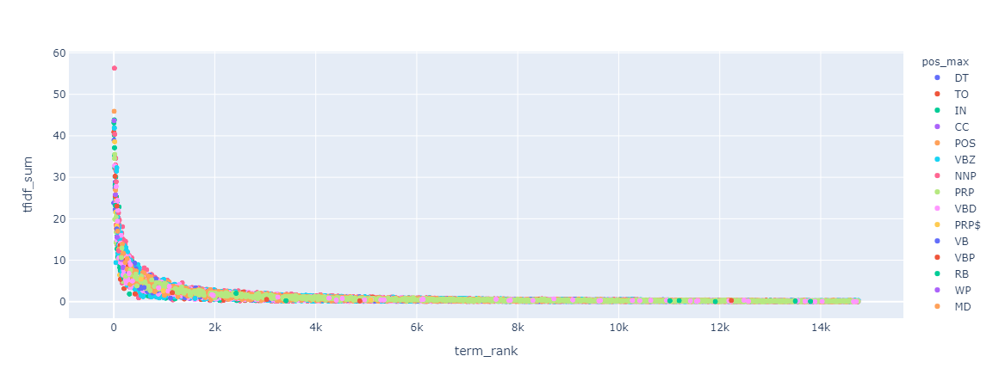

In [238]:
px.scatter(VOCAB, x='term_rank', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max')

In [242]:
LIB = news.loc[:, ['date', 'len', 'orientaion', 'Media']]
LIB.head()

date  len orientaion           Media
source         art_num                                            
New York Times 0        2020-03-31  34   left       New York Times
               1        2020-03-30  34   left       New York Times
               2        2020-03-30  31   left       New York Times
               3        2020-03-30  33   left       New York Times
               4        2020-03-29  36   left       New York Times

In [83]:
# Save files to avoid redoing this over & over

# VOCAB.to_csv('VOCABnews.csv')
# TOKEN.to_csv('TOKENnews.csv')
# BOW.to_csv('DOCnews.csv')
# #DTCM.to_csv('DTCMnews.csv')
# TFIDF.to_csv('TFIDFnews.csv')
LIB.to_csv('LIBnews.csv')

In [3]:
VOCAB = pd.read_csv(r'C:\Users\culle\VOCABnews.csv')
TOKEN = pd.read_csv(r'C:\Users\culle\TOKENnews.csv')
TFIDF = pd.read_csv(r'C:\Users\culle\TFIDFnews.csv')

In [68]:
TOKEN = TOKEN[TOKEN['term_str'].notna()]
#TOKEN = TOKEN.set_index(ARTICLE)

## Use TFIDF to generate PCA

In [69]:
TFIDF = TFIDF.apply(lambda x: x / norm(x), 1)

In [70]:
TFIDF = TFIDF - TFIDF.mean()

In [71]:
COV = TFIDF.cov()

In [72]:
COV.iloc[:5,:10].style.background_gradient()

term_id,1,10,17,19,28,29,30,31,32,33
term_id,,,,,,,,,,
1,4.84592e-05,-1.58276e-08,-1.33262e-08,-4.66791e-09,6.47275e-06,4.42803e-06,5.37223e-07,-5.15678e-08,-5.14469e-08,-1.28723e-07
10,-1.58276e-08,1.36966e-05,3.90388e-06,-7.17817e-10,-1.01476e-07,-1.06574e-07,2.32607e-06,-3.3186e-08,-7.91135e-09,-1.97947e-08
17,-1.33262e-08,3.90388e-06,6.53678e-06,-6.04376e-10,2.81414e-07,-2.99821e-08,1.0499e-06,-2.79414e-08,-6.66107e-09,-1.66664e-08
19,-4.66791e-09,-7.17817e-10,-6.04376e-10,1.51805e-06,6.41551e-07,4.44826e-07,5.39567e-08,-9.78731e-09,-2.33324e-09,-5.8379e-09
28,6.47275e-06,-1.01476e-07,2.81414e-07,6.41551e-07,0.000265742,8.70558e-06,-4.6458e-07,5.72943e-06,-1.15856e-07,-5.08716e-07


In [73]:
eig_vals, eig_vecs = eig(COV)

In [74]:
TERM_IDX = COV.index

In [75]:
EIG_VEC = pd.DataFrame(eig_vecs, index=TERM_IDX, columns=TERM_IDX)
EIG_VAL = pd.DataFrame(eig_vals, index=TERM_IDX, columns=['eig_val'])
EIG_VAL.index.name = 'term_id'

In [76]:
EIG_VEC.iloc[:5, :10].style.background_gradient()

term_id,1,10,17,19,28,29,30,31,32,33
term_id,,,,,,,,,,
1,-0.0462141,0.00498558,-0.00578457,0.0508313,-0.00961355,0.138628,-0.085305,0.00426962,-0.00309026,-0.00112532
10,-0.0346676,-0.00652274,0.0280207,0.0573843,-0.0483422,0.0434889,-0.00550768,0.00969267,-0.0073966,0.0280349
17,-0.469441,0.00538129,0.060209,0.10489,-0.0640493,0.00632338,2.90245e-05,0.0102619,-0.00552002,0.0436307
19,-0.585922,-0.011898,0.0590345,-0.0170749,-0.0439323,-0.120311,0.045996,-0.0390141,0.00812218,0.0407787
28,-0.00243209,-0.000864403,-0.00298474,0.00268741,-0.00445144,-0.00625292,0.00753744,7.43513e-05,-6.8245e-05,0.00343937


In [77]:
EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)
#EIG_PAIRS.head()

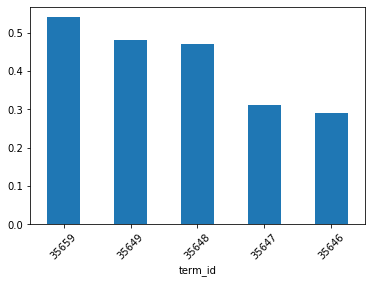

In [78]:
EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)
EIG_PAIRS.exp_var.sort_values(ascending=False).head().plot.bar(rot=45)

In [80]:
EIG_PAIRS.to_csv('EIG_PAIRSnews.csv')

In [ ]:
#EIG_PAIRS = pd.read_csv(r'C:\Users\culle\EIG_PAIRSnews.csv')

In [79]:
EIG_PAIRS.head()

,eig_val,1,10,17,19,28,29,30,31,32,...,35615,35624,35629,35638,35646,35647,35648,35649,35659,exp_var
term_id,,,,,,,,,,,,,,,,,,,,,
1,-1.047904e-18,-0.046214,-0.034668,-0.469441,-0.585922,-0.002432,-0.002211,-0.005729,0.001332,-0.050261,...,-0.001001,-0.000589,0.000097,0.003564,0.000284,-0.002167,-0.002715,0.002315,0.002603,-0.0
10,-6.899065e-19,0.004986,-0.006523,0.005381,-0.011898,-0.000864,0.001699,-0.000383,-0.002922,-0.002374,...,-0.006207,-0.000300,-0.004156,0.003725,-0.002445,0.002715,0.000521,0.000461,-0.001730,-0.0
17,-6.255349e-19,-0.005785,0.028021,0.060209,0.059035,-0.002985,0.000018,0.004045,-0.001742,-0.010820,...,-0.009020,-0.002243,-0.007335,0.003262,-0.004609,0.009070,0.000744,0.008903,0.000528,-0.0
19,-5.816472e-19,0.050831,0.057384,0.104890,-0.017075,0.002687,-0.000202,0.001008,-0.008029,-0.059644,...,0.011595,-0.000792,0.010345,-0.000937,0.004000,-0.026061,0.000687,0.006060,0.004153,-0.0
28,-5.416874e-19,-0.009614,-0.048342,-0.064049,-0.043932,-0.004451,-0.004966,0.003728,0.006592,0.010397,...,-0.005822,0.000101,-0.006033,0.004643,0.001153,0.003345,-0.005112,-0.002602,0.007683,-0.0


In [84]:
# Create top principal components

TOPS = EIG_PAIRS.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
TOPS.index.name = 'comp_id'
TOPS.index = ["PC{}".format(i) for i in TOPS.index.tolist()]

In [85]:
LOADINGS = TOPS[TERM_IDX].T
LOADINGS.index.name = 'term_id'

In [86]:
LOADINGS.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_id,,,,,,,,,,
1,-0.0014249,-0.000811437,-0.00328548,0.000990796,0.000341093,-0.00215122,-0.00174688,0.0028003,0.00163963,-0.00311549
10,0.00011345,1.27724e-06,2.81445e-05,-0.000123529,-0.000200774,-0.00068457,0.00105671,0.000577143,-0.000107656,-0.000473476
17,0.000142543,-0.000236246,-0.00048725,5.93954e-05,-0.00038399,1.13009e-05,0.000171448,0.000219839,-0.000208629,-0.000363257
19,-0.000282436,7.88336e-05,-0.000551636,-2.1235e-05,-0.00036577,0.000143364,-0.000355675,-7.41813e-05,2.05579e-05,-0.000271294
28,-0.00570667,-0.00530923,-0.0121199,0.0103517,-0.00371687,0.00823321,-0.0037253,0.00696817,0.011132,-0.0133506


In [87]:
LOADINGS['term_str'] = LOADINGS.apply(lambda x: VOCAB.loc[int(x.name)].term_str, 1)

In [88]:
lb0_pos = LOADINGS.sort_values('PC0', ascending=True).head(15).term_str.str.cat(sep=' ')
lb0_neg = LOADINGS.sort_values('PC0', ascending=False).head(15).term_str.str.cat(sep=' ')
lb1_pos = LOADINGS.sort_values('PC1', ascending=True).head(15).term_str.str.cat(sep=' ')
lb1_neg = LOADINGS.sort_values('PC1', ascending=False).head(15).term_str.str.cat(sep=' ')
lb2_pos = LOADINGS.sort_values('PC2', ascending=True).head(15).term_str.str.cat(sep=' ')
lb2_neg = LOADINGS.sort_values('PC2', ascending=False).head(15).term_str.str.cat(sep=' ')
lb3_pos = LOADINGS.sort_values('PC3', ascending=True).head(15).term_str.str.cat(sep=' ')
lb3_neg = LOADINGS.sort_values('PC3', ascending=False).head(15).term_str.str.cat(sep=' ')

In [89]:
print('News PC0+', lb0_pos)
print('News PC0-', lb0_neg)
print('News PC1+', lb1_pos)
print('News PC1-', lb1_neg)
print('News PC2+', lb2_pos)
print('News PC2-', lb2_neg)
print('News PC3+', lb3_pos)
print('News PC3-', lb3_neg)

News PC0+ biden i sanders joe democratic warren bernie it presidential is t you he debate vice
News PC0- house coronavirus federal court us border department committee officials monday impeachment images police administration iran
News PC1+ biden sanders bernie joe warren presidential democratic elizabeth sen buttigieg primary debate race vice south
News PC1- impeachment house trump pelosi democrats committee articles president inquiry nancy judiciary donald senate ukraine i
News PC2+ i it you we is t this that are have or our but they us
News PC2- biden joe impeachment house democratic sanders former vice president presidential bernie sen debate committee warren
News PC3+ biden trump president ukraine he his joe coronavirus donald iran vice former whistleblower call us
News PC3- impeachment warren her she pelosi debate democratic elizabeth house candidates democrats articles nancy speaker presidential


PC0 seperates the Democratic debates from everything else <br>
PC1 seperates the Democratic primaries from Trump's impeachment trial <br>
PC2 seperates stop words from substantial political words <br>
PC3 seperates Trump and his issues from the people trying to make him pay for these issues

In [90]:
DCM = TFIDF.dot(TOPS[TERM_IDX].T)

In [90]:
# Create column for the political orientation

orient(x):
    if x == 'CNN' or x == 'New York Times' or x == 'Guardian' or x == 'NPR':
        return 'left'
    else:
        return 'right'

In [92]:
DCM = DCM.reset_index()
DCM['Media'] = DCM['source']
DCM['Orientation'] = DCM['source'].apply(orient)
DCM = DCM.set_index(['source', 'art_num'])
DCM.head()

PC0       PC1       PC2       PC3       PC4       PC5  \
source art_num                                                               
CNN    0        0.065013 -0.050598  0.005134 -0.011780  0.006903  0.006004   
       1        0.082147 -0.073624 -0.004296 -0.000040 -0.068840  0.072048   
       2        0.060658  0.022914  0.028636 -0.067600 -0.090398 -0.001245   
       3        0.033379  0.002340 -0.008696 -0.056302 -0.084846 -0.007402   
       4        0.060375  0.031444  0.052187 -0.016964 -0.001880 -0.001169   

                     PC6       PC7       PC8       PC9 Media Orientation  
source art_num                                                            
CNN    0       -0.042903 -0.006146 -0.012610  0.023174  CNN   left        
       1       -0.115958 -0.018985 -0.029703  0.134202  CNN   left        
       2       -0.041614 -0.110248  0.022727  0.002036  CNN   left        
       3       -0.031319 -0.057827  0.026257  0.020439  CNN   left        
       4       -0.000744 -0.019196 -0.005369 -0.027821  CNN   left

In [103]:
DCM.to_csv('PCnews.csv')

In [93]:
def vis_pcs(M, a, b, label='Orientation', prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color=label, 
                        hover_name='Media', marginal_x='box')
    fig.show()

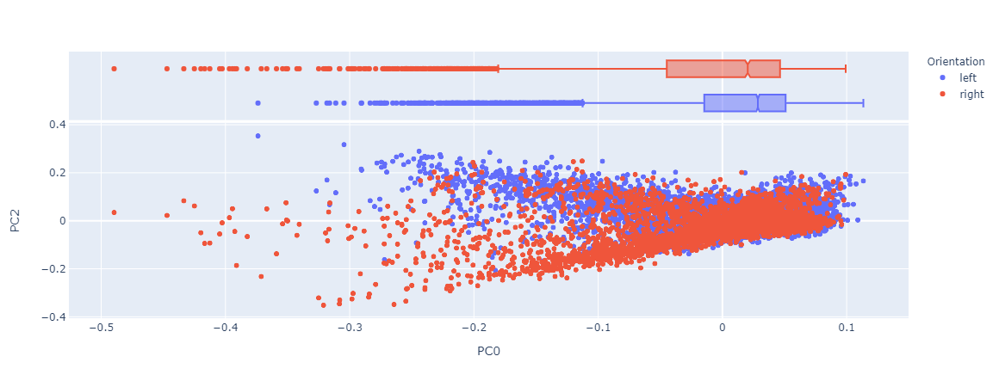

In [100]:
vis_pcs(DCM, 2, 0)

## Topic Modelling with LDA

In [4]:
# Set parameters

n_terms = 4000
n_topics = 50
max_iter = 10

In [34]:
# Create dataframe on the article level

ARTS = news['totContent'].reset_index().set_index(ARTICLE)
ARTS.head()

totContent
source         art_num                                                                                                                                                                                                                                                                                          
New York Times 0        Congress Just Spent $2 Trillion on Coronavirus Relief. It’s Eyeing More..  With the $2 trillion economic stimulus just signed into law on Friday, Washington is already considering a fourth response package to combat the spread of the coronavirus and bolster a shuddering economy. 
               1        What the ‘Cuomo 2020’ Fantasy Says About 2020 Reality.  Daily briefings during the crisis in New York have given Gov. Andrew Cuomo a captive audience, and a growing fan base. But he has made it clear that he’s not going anywhere.                                                   
               2        Trump Won the Internet. Democrats Are Scrambling to Take It Back..  In the era of big data, memes and disinformation, the Democrats are trying to regain their digital edge as the president and his loyalists dictate the terms of debate.                                             
               3        Inside G.M.’s Race to Build Ventilators, Before Trump’s Attack.  The automaker and its partner, Ventec, had spent more than a week figuring out how to make thousands of the lifesaving devices when the White House said G.M. was “wasting time.”                                      
               4        Trump Said He Was the President of Manufacturing. Then Disaster Struck..  For a leader who has embraced the language of a wartime president, it is as if the Pentagon asked for missiles and bombers but wouldn’t say how many or where they should be delivered.

In [35]:
# Create a vector space

tfv = CountVectorizer(max_features=n_terms, stop_words='english')
tf = tfv.fit_transform(ARTS.totContent)
TERMS = tfv.get_feature_names()

In [36]:
# Extract Theta and Pi

lda = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)

THETA = pd.DataFrame(lda.fit_transform(tf), index=ARTS.index)
THETA.columns.name = 'topic_id'

PHI = pd.DataFrame(lda.components_, columns=TERMS)
PHI.index.name = 'topic_id'
PHI.columns.name  = 'term_str'

In [37]:
THETA.head()

topic_id                       0         1         2         3         4  \
source         art_num                                                     
New York Times 0        0.000870  0.000870  0.000870  0.227130  0.000870   
               1        0.000952  0.000952  0.000952  0.000952  0.000952   
               2        0.001429  0.001429  0.001429  0.001429  0.001429   
               3        0.001333  0.001333  0.001333  0.001333  0.001333   
               4        0.001429  0.001429  0.001429  0.001429  0.001429   

topic_id                       5         6         7         8         9  ...  \
source         art_num                                                    ...   
New York Times 0        0.000870  0.000870  0.000870  0.000870  0.000870  ...   
               1        0.000952  0.000952  0.307566  0.000952  0.000952  ...   
               2        0.001429  0.001429  0.001429  0.001429  0.001429  ...   
               3        0.001333  0.001333  0.001333  0.001333  0.187733  ...   
               4        0.001429  0.001429  0.001429  0.001429  0.001429  ...   

topic_id                      40        41        42        43        44  \
source         art_num                                                     
New York Times 0        0.000870  0.000870  0.000870  0.000870  0.000870   
               1        0.000952  0.000952  0.000952  0.000952  0.000952   
               2        0.001429  0.001429  0.001429  0.001429  0.001429   
               3        0.001333  0.001333  0.001333  0.001333  0.001333   
               4        0.001429  0.001429  0.001429  0.001429  0.001429   

topic_id                      45        46        47        48        49  
source         art_num                                                    
New York Times 0        0.000870  0.000870  0.000870  0.000870  0.000870  
               1        0.000952  0.000952  0.000952  0.000952  0.063080  
               2        0.001429  0.001429  0.001429  0.001429  0.001429  
               3        0.001333  0.001333  0.001333  0.001333  0.001333  
               4        0.001429  0.001429  0.001429  0.165258  0.001429  

[5 rows x 50 columns]

In [38]:
THETA.to_csv('TOPICnews.csv')

In [39]:
maxTopic = pd.DataFrame(THETA.idxmax(axis=1)).rename(columns={0: "MaxTopic"})
maxTopic.head()

MaxTopic
source         art_num          
New York Times 0        11      
               1        11      
               2        36      
               3        32      
               4        24

In [40]:
maxTopic.shape

(11092, 1)

In [41]:
PHI.T.sample(10).style.background_gradient()

topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49
term_str,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
correctly,0.02,0.02,0.02,0.02,0.02,0.02,2.21069,0.02,0.247376,0.02,0.488632,0.02,0.26634,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.0200013,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,20.4584,1.44851,0.02
proves,0.02,0.02,0.02,0.02,2.93515,0.02,0.02,0.02,0.02,0.02,1.38481,0.02,0.02,0.62296,0.02,0.02,1.20086,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,4.02,0.02,0.02,0.02,0.02,0.02,0.02,2.13298,0.02,0.02,0.02,1.05789,0.02,0.02,3.30912,0.02,0.02,0.02,8.51623,0.02,0.02
position,0.02,0.02,4.55897,0.02,0.02,4.57272,0.02,1.55972,5.17659,0.02,0.655185,0.02,8.22944,0.02,0.02,11.554,0.500524,24.9459,2.19887,0.02,0.02,2.5347,10.0896,0.02,3.70078,0.02,3.90121,0.02,18.2105,0.02,0.02,0.02,3.22949,3.0555,0.02,7.35227,0.02,0.02,24.9515,1.27532,2.98975,0.02,0.02,0.02,0.02,0.02,0.02,19.1975,0.02,0.02
shelter,0.02,0.02,0.02,0.02,0.02,0.02,2.1458,0.02,0.02,0.02,0.02,0.02,0.02,4.35244,0.02,0.02,0.02,12.6312,0.02,0.02,0.02,0.02,6.89625,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,2.07433,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02
york,8.99125,0.02,0.40793,0.0201563,1.35971,0.02,353.006,10.1495,115.682,0.02,0.02,90.5355,13.7805,7.03735,0.02,0.924124,7.82086,4.86076,6.47715,0.02,0.02,0.02,2.3353,4.16626,51.7611,0.02,8.64822,49.1817,0.28726,0.02,0.940497,4.9638,0.02,0.02,0.02,0.02,7.45428,48.158,0.02,0.02,0.02,0.02,6.67726,4.23286,0.02,0.0200001,15.008,0.0202084,41.5334,7.17877
kid,0.02,0.02,0.02,0.02,0.02,0.02,22.7632,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,1.15561,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,2.02427,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.136923,0.02,0.020005
efforts,0.02,1.69849,4.50757,0.02,5.22399,0.02,0.02,0.02,8.26148,0.02,0.02,0.02,14.7624,13.603,0.02,8.27372,3.84084,0.02,10.9246,0.02,7.30495,7.33024,12.7514,0.02,9.33427,15.1573,7.00895,0.02,4.02355,6.32316,0.02,0.02,0.02,0.02,0.02,4.48422,6.58703,3.65659,2.81175,0.02,0.763906,10.5228,0.02,9.87824,0.02,18.3049,0.02,0.02,5.18061,0.02
writer,0.02,0.02,0.02,0.02,0.02,0.02,0.02,3.68753,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,3.09358,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,17.9071,0.961809,1.49579,0.02,0.02,0.02,0.02,0.02,1.93299,0.02,0.02,0.18658,0.02,0.482881,0.02,0.02,9.43256,0.02,8.01914
isis,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,1.28816,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,24.3398,0.02,54.5337,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,1.17425,0.02,0.02,0.02,0.02,3.38715,6.3963,0.02,0.02,0.02,0.02,0.0206204,0.02,0.02,0.02


In [42]:
# Get terms per topic

TOPICS = PHI.stack().to_frame().rename(columns={0:'weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(10)\
               .reset_index()\
               .drop('topic_id',1)\
               .term_str)

In [43]:
TOPICS.loc[[0, 2, 3, 4, 8, 9, 10, 12, 14, 15, 16, 19, 20, 21, 26, 27, 30, 34, 37, 41, 43, 44, 46, 48, 49], :]

term_str,0,1,2,3,4,5,6,7,8,9
topic_id,,,,,,,,,,
0,investigation,general,report,russia,mueller,department,attorney,justice,barr,trump
2,tuesday,election,voters,super,vote,primary,state,states,democratic,2020
3,coronavirus,trump,pandemic,poll,president,outbreak,new,americans,spread,response
4,court,supreme,case,judge,federal,justice,law,abortion,guilty,roberts
8,times,new,kavanaugh,york,sexual,justice,brett,assault,county,alleged
9,cortez,ocasio,killed,rep,carolina,north,alexandria,inside,south,texas
10,minister,prime,israel,dead,economy,netanyahu,government,kushner,year,israeli
12,trump,china,trade,president,north,korea,chinese,deal,united,states
14,fbi,information,steele,fisa,intelligence,page,nunes,report,surveillance,trump


## Interesting topics:

0: Mueller repot, 2: Super Tuesday, 3 & 13: coronavirus, 4: Supreme court, 8: Kavannah, 9: AOC, 10: Israel, 11: State's rights 12: US China trade deal, 14: Nunes Memo, 7 & 15 & 33: Democratic Primaries, 16: Trump dealings with Ukraine, 18: Republicans, 19: general murder news, 20 & 25: Trump impeachment, 21: Climate change, 26: Iran / US skirmish, 27: Racism, 30: Students/college, 31: Omar Ilhan marraige story, 34: Gun Control debate, 35: general social media, 37: Mike Bloomberg tv adds/campaign, 41: tax and finance, 43: Mexico Illegal Immigation, 44: Hong Kong protests, 46: Police news, 48: Healtch care, 49: Sports

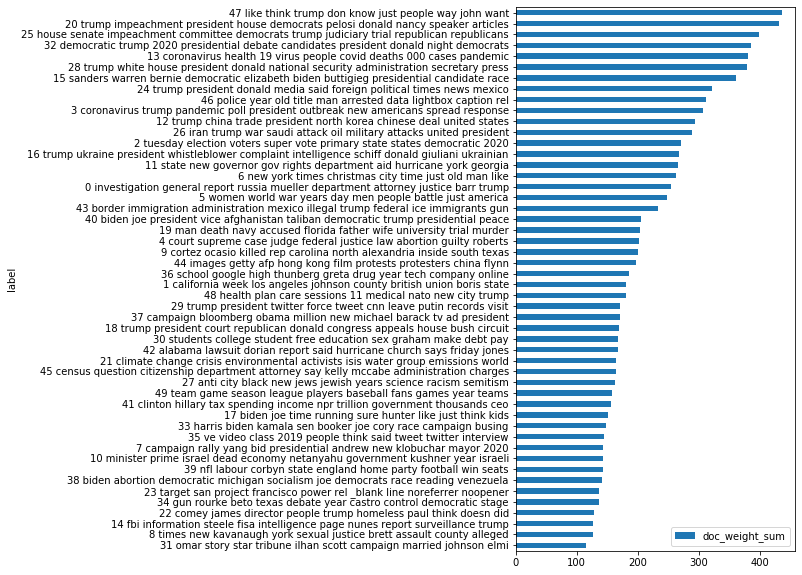

In [44]:
# Sort topics by doc weight

TOPICS['label'] = TOPICS.apply(lambda x: str(x.name) + ' ' + ' '.join(x), 1)
TOPICS['doc_weight_sum'] = THETA.sum()
TOPICS.sort_values('doc_weight_sum', ascending=True).plot.barh(y='doc_weight_sum', x='label', figsize=(5,10))

In [45]:
topic_cols = [t for t in range(n_topics)]

MEDIA = THETA.reset_index()
MEDIA['Media'] = MEDIA['source']
#MEDIA['Orientation'] = MEDIA['source'].apply(orient)
MEDIA = MEDIA.set_index(['source', 'art_num']).groupby('source')[topic_cols].mean().T   
MEDIA.head()

source,CNN,Fox,Guardian,NPR,New York Times,PowerLine,Real Clear Politics
topic_id,,,,,,,
0,0.031698,0.021865,0.019721,0.010691,0.019800,0.023151,0.022737
1,0.013509,0.022170,0.010314,0.019945,0.013704,0.004989,0.019697
2,0.028164,0.013916,0.051169,0.015296,0.049099,0.010662,0.030860
3,0.041308,0.018461,0.034661,0.025859,0.035037,0.010074,0.016237
4,0.025743,0.014532,0.009841,0.019406,0.014826,0.014806,0.013929


In [46]:
MEDIA['topterms'] = TOPICS[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)

In [55]:
# Show top 50 topics by source

MEDIA.sort_values('Guardian', ascending=False).style.background_gradient()

source,CNN,Fox,Guardian,NPR,New York Times,PowerLine,Real Clear Politics,topterms
topic_id,,,,,,,,
20,0.0564027,0.0305014,0.0602397,0.0130769,0.0311557,0.0144381,0.0502379,trump impeachment president house democrats pelosi donald nancy speaker articles
28,0.0576777,0.0186295,0.0601229,0.0182651,0.045551,0.00860208,0.0195383,trump white house president donald national security administration secretary press
15,0.0393363,0.0158748,0.0581377,0.0116162,0.0897921,0.0422834,0.0354135,sanders warren bernie democratic elizabeth biden buttigieg presidential candidate race
2,0.0281642,0.013916,0.0511689,0.0152959,0.0490993,0.0106617,0.0308597,tuesday election voters super vote primary state states democratic 2020
32,0.0499941,0.0300891,0.0479113,0.0111502,0.0462421,0.011999,0.0399254,democratic trump 2020 presidential debate candidates president donald night democrats
47,0.0141207,0.0142882,0.0465936,0.0171086,0.0169919,0.19854,0.0889622,like think trump don know just people way john want
24,0.039668,0.0210747,0.0383485,0.0121539,0.0350681,0.0199388,0.0391216,trump president donald media said foreign political times news mexico
12,0.0263323,0.0174561,0.0362045,0.0266283,0.0327719,0.0163298,0.0461082,trump china trade president north korea chinese deal united states
38,0.0102703,0.00841941,0.0358468,0.00870567,0.0125002,0.01156,0.0176222,biden abortion democratic michigan socialism joe democrats race reading venezuela


## Perform Hierarchical Clustering

In [61]:
def plot_tree(tree, labels):
    plt.figure()
    fig, axes = plt.subplots(figsize=(5, 10))
    dendrogram = sch.dendrogram(tree, labels=labels, orientation="left")
    plt.tick_params(axis='both', which='major', labelsize=14)

In [62]:
SIMS = pdist(normalize(PHI), metric='cosine')
TREE = sch.linkage(SIMS, method='ward')

In [63]:
labels  = ["{}: {}".format(a,b) for a, b in zip(MEDIA.index,  MEDIA.topterms.tolist())]

<Figure size 432x288 with 0 Axes>

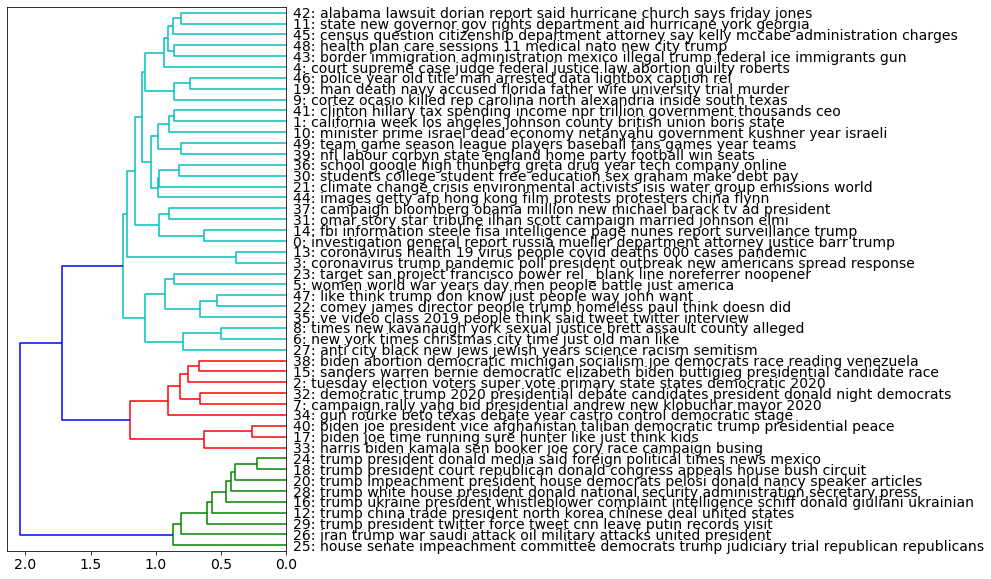

In [66]:
#IPython.OutputArea.auto_scroll_threshold = 9999;

plot_tree(TREE, labels)

As you can see here the topic model clustering has closely linked topics dealing with the Trump impeachment trial (green), the democratic primaries (red), and left everything else in its own cluster. It should also be noted that the 2 coronavirus topics are fairly distinct from the remainder of the blue topics.

## Word Embeddings

In [68]:
TOKEN = TOKEN[TOKEN['term_str'].notna()]

In [69]:
corpus = TOKEN.groupby(ARTICLE)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [70]:
model = word2vec.Word2Vec(corpus, size=121, window=5, min_count=100, workers=4)

In [71]:
coords = pd.DataFrame(index=range(len(model.wv.vocab)))
coords['label'] = [w for w in model.wv.vocab]
coords['vector'] = coords['label'].apply(lambda x: model.wv.get_vector(x))

coords.shape

(1199, 2)

In [72]:
wordEmbed = coords.loc[:, ['label', 'vector']]
wordEmbed.to_csv('WEMBEDnews.csv')

In [73]:
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23, learning_rate=350)
tsne_values = tsne_model.fit_transform(coords['vector'].tolist())

In [74]:
coords['x'] = tsne_values[:,0]
coords['y'] = tsne_values[:,1]


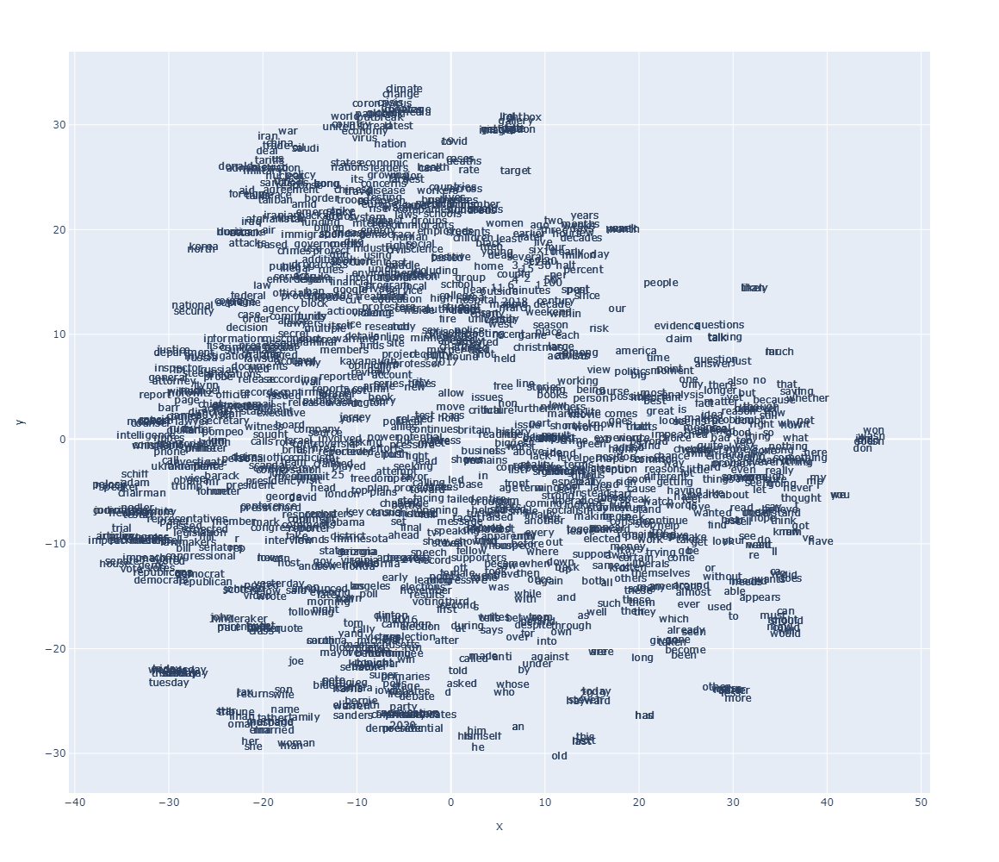

In [80]:
px.scatter(coords, 'x', 'y', text='label', height=1000).update_traces(mode='text')

This has changed since this interpretaion, but many of these groupings still exist: <br> <br>

Note that at bottom left, significantly removed from the rest are coronavirus and climate change. It shows that these issues are distinct from the usual political nonsense. There is also the police/murder section at the bottom middle (x = 8, y = -23). Top left is all Democratic primary words.

## Sentiment Analysis

In [81]:
TOKEN = pd.read_csv(r'C:\Users\culle\TOKENnews.csv')
TOKEN = pd.merge(TOKEN, maxTopic,  how='left', left_on=['source','art_num'], right_on = ['source','art_num'])

In [82]:
TOKEN.head()

,source,art_num,sent_num,token_num,pos,token_str,term_str,term_id,MaxTopic
0,New York Times,0,0,0,NNP,Congress,congress,7481,11
1,New York Times,0,0,1,NNP,Just,just,17787,11
2,New York Times,0,0,2,NNP,Spent,spent,29958,11
3,New York Times,0,0,4,CD,2,2,495,11
4,New York Times,0,0,5,NNP,Trillion,trillion,32670,11


In [83]:
TOKEN = TOKEN.reset_index().set_index(SENTENCE).drop('index', axis=1 )
TOKEN.head()

token_num  pos token_str  term_str  term_id  \
source         art_num sent_num                                                
New York Times 0       0         0          NNP  Congress  congress  7481      
                       0         1          NNP  Just      just      17787     
                       0         2          NNP  Spent     spent     29958     
                       0         4          CD   2         2         495       
                       0         5          NNP  Trillion  trillion  32670     

                                 MaxTopic  
source         art_num sent_num            
New York Times 0       0         11        
                       0         11        
                       0         11        
                       0         11        
                       0         11

In [84]:
salex = pd.read_csv(r'Downloads/salex_nrc.csv').set_index('term_str')
salex.columns = [col.replace('nrc_','') for col in salex.columns]

In [85]:
salex.head()

,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust
term_str,,,,,,,,,,
abandon,0,0,0,1,0,1,0,1,0,0
abandoned,1,0,0,1,0,1,0,1,0,0
abandonment,1,0,0,1,0,1,0,1,1,0
abduction,0,0,0,1,0,1,0,1,1,0
aberration,0,0,1,0,0,1,0,0,0,0


In [86]:
salex['polarity'] = salex.positive - salex.negative
emo_cols = "anger anticipation disgust fear joy sadness surprise trust polarity".split()

In [87]:
sTOKEN = TOKEN.join(salex, on='term_str', how='left')
sTOKEN[emo_cols] = sTOKEN[emo_cols].fillna(0)

In [88]:
sTOKEN.sample(10)

token_num  pos  token_str   term_str  term_id  \
source    art_num sent_num                                                  
PowerLine 161     24        29         IN   in         in         16353     
Fox       925     1         25         IN   between    between    4235      
PowerLine 120     18        48         VBN  seen       seen       28426     
          822     17        1          DT   a          a          1354      
CNN       2986    1         13         NNP  Michigan   michigan   20432     
          1142    1         14         NNP  Trump      trump      32761     
PowerLine 111     19        14         NN   matter     matter     19929     
          115     7         60         NNP  Community  community  7164      
Guardian  486     1         3          NN   president  president  24743     
Fox       1519    0         21         VBP  say        say        28031     

                            MaxTopic  anger  anticipation  disgust  fear  joy  \
source    art_num sent_num                                                      
PowerLine 161     24        31        0.0    0.0           0.0      0.0   0.0   
Fox       925     1         17        0.0    0.0           0.0      0.0   0.0   
PowerLine 120     18        7         0.0    0.0           0.0      0.0   0.0   
          822     17        5         0.0    0.0           0.0      0.0   0.0   
CNN       2986    1         25        0.0    0.0           0.0      0.0   0.0   
          1142    1         20        0.0    0.0           0.0      0.0   0.0   
PowerLine 111     19        47        0.0    0.0           0.0      0.0   0.0   
          115     7         0         0.0    0.0           0.0      0.0   0.0   
Guardian  486     1         30        0.0    0.0           0.0      0.0   0.0   
Fox       1519    0         46        0.0    0.0           0.0      0.0   0.0   

                            negative  positive  sadness  surprise  trust  \
source    art_num sent_num                                                 
PowerLine 161     24       NaN       NaN        0.0      0.0       0.0     
Fox       925     1        NaN       NaN        0.0      0.0       0.0     
PowerLine 120     18       NaN       NaN        0.0      0.0       0.0     
          822     17       NaN       NaN        0.0      0.0       0.0     
CNN       2986    1        NaN       NaN        0.0      0.0       0.0     
          1142    1        NaN       NaN        0.0      0.0       0.0     
PowerLine 111     19       NaN       NaN        0.0      0.0       0.0     
          115     7        NaN       NaN        0.0      0.0       0.0     
Guardian  486     1         0.0       1.0       0.0      0.0       1.0     
Fox       1519    0        NaN       NaN        0.0      0.0       0.0     

                            polarity  
source    art_num sent_num            
PowerLine 161     24        0.0       
Fox       925     1         0.0       
PowerLine 120     18        0.0       
          822     17        0.0       
CNN       2986    1         0.0       
          1142    1         0.0       
PowerLine 111     19        0.0       
          115     7         0.0       
Guardian  486     1         1.0       
Fox       1519    0         0.0

In [91]:
sTOKEN = sTOKEN.reset_index()
sTOKEN['Orientation'] = sTOKEN['source'].apply(orient)
sTOKEN = sTOKEN.set_index(SENTENCE)

In [92]:
sTOKEN.groupby('source')['anger'].mean()*100

source
CNN                    2.078831
Fox                    2.826801
Guardian               1.941498
NPR                    2.325357
New York Times         1.697540
PowerLine              1.687995
Real Clear Politics    2.053181
Name: anger, dtype: float64

In [93]:
sTOKEN.groupby('source')['anticipation'].mean()*100

source
CNN                    2.074778
Fox                    2.260833
Guardian               1.922248
NPR                    2.260649
New York Times         2.072786
PowerLine              1.632424
Real Clear Politics    1.836428
Name: anticipation, dtype: float64

In [94]:
sTOKEN.groupby('source')['disgust'].mean()*100

source
CNN                    1.044818
Fox                    1.395144
Guardian               1.050499
NPR                    1.115180
New York Times         0.804098
PowerLine              1.126547
Real Clear Politics    1.320999
Name: disgust, dtype: float64

In [95]:
sTOKEN.groupby('source')['fear'].mean()*100

source
CNN                    2.675870
Fox                    3.655215
Guardian               2.427331
NPR                    3.185836
New York Times         2.209780
PowerLine              2.115342
Real Clear Politics    2.682960
Name: fear, dtype: float64

In [96]:
sTOKEN.groupby('source')['joy'].mean()*100

source
CNN                    1.371704
Fox                    1.811252
Guardian               1.602332
NPR                    1.752623
New York Times         1.471201
PowerLine              1.463364
Real Clear Politics    1.479724
Name: joy, dtype: float64

In [97]:
sTOKEN.groupby('source')['sadness'].mean()*100

source
CNN                    1.572968
Fox                    2.269961
Guardian               1.641749
NPR                    2.216593
New York Times         1.584371
PowerLine              1.566157
Real Clear Politics    1.894457
Name: sadness, dtype: float64

In [98]:
sTOKEN.groupby('source')['trust'].mean()*100

source
CNN                    4.300167
Fox                    3.782254
Guardian               3.541997
NPR                    3.218878
New York Times         3.883495
PowerLine              2.999517
Real Clear Politics    3.357114
Name: trust, dtype: float64

In [99]:
sTOKEN.groupby('source')['polarity'].mean()*100

source
CNN                    1.350092
Fox                    0.075310
Guardian               0.729666
NPR                   -0.002754
New York Times         1.363988
PowerLine              0.495702
Real Clear Politics    0.189446
Name: polarity, dtype: float64

In [ ]:
libSent = sTOKEN[sTOKEN['Orientation'] == 'left']
pubSent = sTOKEN[sTOKEN['Orientation'] == 'right']

# libSent.sample(10)

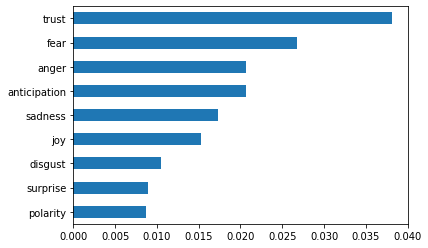

In [101]:
libSent[emo_cols].mean().sort_values().plot.barh()

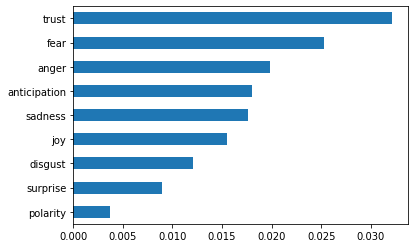

In [102]:
pubSent[emo_cols].mean().sort_values().plot.barh()

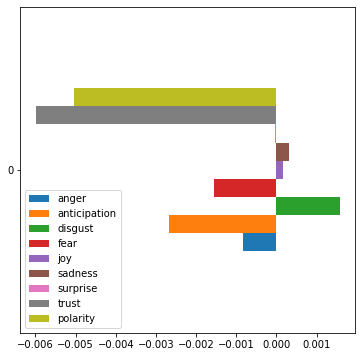

In [114]:
pd.DataFrame([pubSent[emo_cols].mean() - libSent[emo_cols].mean()]).plot.barh(figsize = (6, 6))

In [ ]:
lib_sents = libSent.groupby(SENTENCE)[emo_cols + ['MaxTopic']].mean()
pub_sents = pubSent.groupby(SENTENCE)[emo_cols + ['MaxTopic']].mean()

# pub_sents.head()

In [116]:
lib_sents['sent_str'] = libSent.groupby(SENTENCE).term_str.apply(lambda x: x.str.cat(sep=' '))
pub_sents['sent_str'] = pubSent.groupby(SENTENCE).term_str.apply(lambda x: x.str.cat(sep=' '))

lib_sents.head()

anger  anticipation   disgust      fear  joy  \
source art_num sent_num                                                    
CNN    0       0         0.000000  0.090909      0.000000  0.090909  0.0   
               1         0.000000  0.000000      0.000000  0.000000  0.0   
               2         0.000000  0.050000      0.000000  0.100000  0.0   
       1       0         0.000000  0.000000      0.111111  0.111111  0.0   
               1         0.026316  0.026316      0.105263  0.157895  0.0   

                          sadness  surprise     trust  polarity  MaxTopic  \
source art_num sent_num                                                     
CNN    0       0         0.000000  0.0       0.090909  0.090909  48         
               1         0.000000  0.0       0.000000  0.000000  48         
               2         0.000000  0.0       0.050000  0.000000  48         
       1       0         0.111111  0.0       0.000000 -0.111111  4          
               1         0.131579  0.0       0.026316 -0.131579  4          

                                                                                                                                                                                                                                                                             sent_str  
source art_num sent_num                                                                                                                                                                                                                                                                
CNN    0       0         illinois governor says feds sent wrong type of protective medical masks                                                                                                                                                                                       
               1         illinois gov                                                                                                                                                                                                                                                  
               2         said monday that the federal government sent the wrong type of medical masks in a that his state recently received                                                                                                                                            
       1       0         federal judge blocks texas order abortion access over coronavirus                                                                                                                                                                                             
               1         a federal judge has blocked a texas executive order banning non essential medical procedures from limiting abortion access during the coronavirus outbreak a win for abortion rights activists as the fight over abortion rights with the worsening pandemic

In [117]:
# Use VADER

analyser = SentimentIntensityAnalyzer()

In [118]:
pub_vader_cols = pub_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
pub_vader = pd.concat([pub_sents, pub_vader_cols], axis=1)

In [119]:
lib_vader_cols = lib_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
lib_vader = pd.concat([lib_sents, lib_vader_cols], axis=1)

lib_vader.tail()

anger  anticipation   disgust      fear  \
source         art_num sent_num                                               
New York Times 399     0         0.000000  0.066667      0.066667  0.066667   
                       1         0.034483  0.000000      0.034483  0.000000   
               400     0         0.090909  0.000000      0.000000  0.090909   
                       1         0.000000  0.066667      0.000000  0.000000   
                       2         0.000000  0.000000      0.000000  0.000000   

                                      joy  sadness  surprise     trust  \
source         art_num sent_num                                          
New York Times 399     0         0.000000  0.0      0.0       0.133333   
                       1         0.000000  0.0      0.0       0.000000   
               400     0         0.000000  0.0      0.0       0.000000   
                       1         0.066667  0.0      0.0       0.133333   
                       2         0.000000  0.0      0.0       0.100000   

                                 polarity  MaxTopic  \
source         art_num sent_num                       
New York Times 399     0         0.066667  3          
                       1        -0.068966  3          
               400     0        -0.090909  24         
                       1         0.133333  24         
                       2         0.100000  24         

                                                                                                                                                                                                     sent_str  \
source         art_num sent_num                                                                                                                                                                                 
New York Times 399     0         congress weighs whether to allow guantánamo prisoners to travel to the us for medical care                                                                                     
                       1         the pentagon has been putting a new focus on the health care needs of aging detainees but there is still considerable political opposition to allowing them on american soil   
               400     0         a new threat from trump and old questions about its effectiveness                                                                                                              
                       1         time and again the president has engaged in a game of geopolitical chicken with mexico                                                                                         
                       2         but there was no more guarantee that the tactic will be any more effective this time than in the past                                                                          

                                   neg    neu    pos  compound  
source         art_num sent_num                                 
New York Times 399     0         0.162  0.588  0.250  0.2023    
                       1         0.000  0.930  0.070  0.2732    
               400     0         0.254  0.746  0.000 -0.5267    
                       1         0.000  0.838  0.162  0.4019    
                       2         0.199  0.631  0.170  0.0618

In [ ]:
lib_vader['has_trump'] = lib_vader['sent_str'].str.contains('trump')
pub_vader['has_trump'] = pub_vader['sent_str'].str.contains('trump')

# lib_vader.tail()

In [121]:
lib_vader.groupby(['source', 'has_trump'])['compound'].mean()*100

source          has_trump
CNN             False       -0.370179 
                True        -3.312404 
Guardian        False       -0.851117 
                True        -10.357702
NPR             False       -4.470343 
                True        -5.993057 
New York Times  False        2.219840 
                True        -1.129677 
Name: compound, dtype: float64

In [122]:
pub_vader.groupby(['source', 'has_trump'])['compound'].mean()*100

source               has_trump
Fox                  False       -15.063944
                     True        -5.731867 
PowerLine            False        2.674138 
                     True         2.793979 
Real Clear Politics  False       -0.625384 
                     True        -1.164219 
Name: compound, dtype: float64

In [124]:
lib_vader['orientation'] = 'left'
pub_vader['orientation'] = 'right'
totSent = pd.concat([lib_vader, pub_vader])

In [125]:
topicBias = pd.DataFrame(totSent.groupby(['MaxTopic', 'orientation'])['compound'].mean()*100)

pd.set_option('display.max_rows', None)
topicBias

compound
MaxTopic orientation           
0        left         2.212717 
         right       -0.901020 
1        left        -2.253850 
         right       -6.908919 
2        left         18.160376
         right        11.224249
3        left        -0.494393 
         right       -2.724202 
4        left         8.242306 
         right        4.578589 
5        left        -7.863828 
         right       -2.392918 
6        left         2.364604 
         right        6.869423 
7        left         3.078764 
         right        1.045738 
8        left        -4.643942 
         right       -3.768486 
9        left        -23.126449
         right       -32.821429
10       left        -4.399838 
         right       -0.033587 
11       left        -5.054679 
         right       -10.879952
12       left        -7.713029 
         right        8.039836 
13       left        -6.110211 
         right       -2.571698 
14       left         7.822137 
         right        2.992513 
15       left         9.559693 
         right        8.145266 
16       left        -6.073669 
         right       -4.918227 
17       left         1.060492 
         right        2.560149 
18       left        -3.884718 
         right        4.849710 
19       left        -26.921783
         right       -44.006561
20       left        -4.064404 
         right       -3.184963 
21       left        -13.809124
         right       -8.049922 
22       left        -9.430550 
         right       -6.493245 
23       left        -2.158171 
         right       -0.545108 
24       left        -14.853102
         right       -5.444286 
25       left        -0.313677 
         right       -2.763688 
26       left        -19.185948
         right       -18.714096
27       left        -8.374977 
         right       -5.780796 
28       left         0.637595 
         right       -0.188095 
29       left        -4.177509 
         right        3.854537 
30       left        -5.145564 
         right       -3.662544 
31       left        -19.318448
         right       -2.267619 
32       left         2.781864 
         right        1.164450 
33       left        -3.945000 
         right       -6.622786 
34       left        -13.757616
         right        4.646099 
35       left        -1.506463 
         right        5.294554 
36       left        -4.139703 
         right       -3.174885 
37       left         2.550586 
         right       -2.195188 
38       left         1.980107 
         right        0.137411 
39       left         0.936610 
         right        6.270460 
40       left        -1.172982 
         right       -3.796032 
41       left         1.689510 
         right        9.951628 
42       left        -14.240943
         right       -27.334877
43       left        -7.458065 
         right       -23.679843
44       left        -7.479837 
         right       -3.128327 
45       left        -4.833218 
         right       -14.956519
46       left        -24.852021
         right       -41.970359
47       left         5.768282 
         right        2.238730 
48       left        -5.844949 
         right        0.700731 
49       left         13.585938
         right        15.161908

0: Mueller repot, 2: Super Tuesday, 3 & 13: coronavirus, 4: Supreme court, 8: Kavannah, 9: AOC, 10: Israel, 12: US China trade deal, 14: Nunes Memo, 7 & 15 & 33: Democratic Primaries, 16: Trump dealings with Ukraine, 18: Republicans, 19: general murder news, 20 & 25: Trump impeachment, 21: Climate change, 26: Iran / US skirmish, 27: Racism, 28: Trump, 30: Students/college, 31: Omar Ilhan marraige story, 34: Gun Control debate, 35: general social media, 37: Mike Bloomberg tv adds/campaign, 41: tax and finance, 43: Mexico Illegal Immigation, 44: Hong Kong protests, 46: Police news, 48: Healtch care, 49: Sports

In [162]:
totSent.to_csv('SENTnews.csv')

In [ ]:
sourceStat = pd.DataFrame(totSent.groupby(['MaxTopic', 'source']).agg({'compound': [np.mean, np.std, 'count']}))
# sourceStat

In [131]:
sum(sourceStat[('compound', 'count')])

44016

In [132]:
totSent = totSent.reset_index()

df = totSent[totSent['source'] != 'CNN']
exStats1 = pd.DataFrame(df.groupby('MaxTopic').agg({'compound': [np.mean, np.std, 'count']}))
exStats1['source'] = 'CNN'

for source in totSent.source.unique()[1:]:
    df = totSent[totSent['source'] != source]
    exStats = pd.DataFrame(df.groupby('MaxTopic').agg({'compound': [np.mean, np.std, 'count']}))
    exStats['source'] = source
    exStats1 = pd.concat([exStats1, exStats])

exStats1 = exStats1.rename(columns={'mean': 'meanEx', 'std': 'stdEx', 'count': 'countEx'})
sourceStat = pd.merge(sourceStat.reset_index(), exStats1.reset_index(), on=['MaxTopic', 'source'], how='left').set_index(['MaxTopic', 'source'])


C:\Users\culle\Anaconda3\lib\site-packages\pandas\core\generic.py:3946: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



In [ ]:
sourceStat.columns = sourceStat.columns.droplevel(0)
# sourceStat

In [134]:
sourceStat['t'] = ((sourceStat['mean'] - sourceStat['meanEx']) / (np.sqrt((sourceStat['std']) / sourceStat['count'])
    + (sourceStat['stdEx'] / sourceStat['countEx'])))

sourceStat['t_score'] = t.pdf(sourceStat['t'], sourceStat['count']-1)

In [135]:
sourceStat

mean       std  count    meanEx     stdEx  \
MaxTopic source                                                               
0        CNN                  0.030993  0.427181  236   -0.005476  0.429599   
         Fox                 -0.072088  0.462369  116    0.022022  0.420677   
         Guardian            -0.014753  0.414590  72     0.009061  0.430667   
         NPR                  0.011635  0.293387  34     0.006395  0.434692   
         New York Times       0.083440  0.406589  15     0.004989  0.429434   
         PowerLine           -0.005310  0.437447  160    0.010124  0.426644   
         Real Clear Politics  0.078327  0.425100  77    -0.002073  0.428808   
1        CNN                  0.015528  0.270112  118   -0.066997  0.403868   
         Fox                 -0.118374  0.424917  96    -0.014227  0.343861   
         Guardian             0.322631  0.423942  13    -0.054053  0.360332   
         NPR                 -0.098038  0.348148  76    -0.026403  0.372804   
         New York Times      -0.193121  0.259080  19    -0.032816  0.372075   
         Real Clear Politics  0.021898  0.419415  52    -0.051111  0.359427   
2        CNN                  0.246703  0.386014  177    0.143207  0.416827   
         Fox                  0.179209  0.476778  64     0.162410  0.407767   
         Guardian             0.157649  0.422471  320    0.166906  0.407662   
         NPR                  0.192055  0.353965  99     0.160082  0.419564   
         New York Times       0.110712  0.396369  69     0.168010  0.414052   
         PowerLine            0.172867  0.438824  52     0.163038  0.411403   
         Real Clear Politics  0.048667  0.410075  117    0.180826  0.410690   
3        CNN                  0.061538  0.385800  343   -0.052029  0.409939   
         Fox                 -0.126246  0.436511  113    0.004597  0.398131   
         Guardian            -0.074850  0.434523  153    0.001293  0.398039   
         NPR                 -0.063954  0.295894  169    0.000495  0.424103   
         New York Times      -0.084011  0.365768  27    -0.008844  0.405945   
         PowerLine            0.146027  0.459609  89    -0.027231  0.395535   
         Real Clear Politics -0.104215  0.440103  55    -0.005247  0.402167   
4        CNN                  0.141963  0.489798  205    0.033709  0.449756   
         Fox                 -0.109147  0.523644  73     0.085242  0.452785   
         Guardian             0.060372  0.365766  43     0.065452  0.469886   
         NPR                 -0.016101  0.367167  113    0.080624  0.478945   
         New York Times       0.072067  0.337842  12     0.065023  0.466061   
         PowerLine            0.086804  0.477983  212    0.055846  0.458049   
         Real Clear Politics  0.100250  0.427482  48     0.062581  0.466752   
5        CNN                 -0.058642  0.469294  62    -0.043653  0.454978   
         Fox                 -0.118658  0.495688  208   -0.025540  0.443105   
         Guardian            -0.183838  0.442780  66    -0.034911  0.455166   
         NPR                 -0.054976  0.407868  246   -0.041249  0.470043   
         New York Times      -0.090390  0.390973  10    -0.044111  0.456380   
         PowerLine            0.018564  0.466987  321   -0.073640  0.447670   
         Real Clear Politics  0.033816  0.413406  105   -0.053580  0.459600   
6        CNN                  0.144003  0.422469  36     0.057027  0.422056   
         Fox                  0.009280  0.479182  218    0.065706  0.413223   
         Guardian            -0.093514  0.439453  73     0.065309  0.420268   
         NPR                  0.034284  0.348321  275    0.063271  0.434223   
         New York Times       0.208557  0.422707  7      0.058196  0.422135   
         PowerLine            0.089593  0.422359  1047   0.014666  0.418134   
         Real Clear Politics -0.004492  0.421137  122    0.063450  0.421947   
7        CNN                  0.055858  0.387210  107    0.004037  0.447181   
     

In [136]:
sourceStat[abs(sourceStat['t_score']) < 0.05]

mean       std  count    meanEx     stdEx  \
MaxTopic source                                                               
2        CNN                  0.246703  0.386014  177    0.143207  0.416827   
         Real Clear Politics  0.048667  0.410075  117    0.180826  0.410690   
3        CNN                  0.061538  0.385800  343   -0.052029  0.409939   
         Fox                 -0.126246  0.436511  113    0.004597  0.398131   
         PowerLine            0.146027  0.459609  89    -0.027231  0.395535   
4        CNN                  0.141963  0.489798  205    0.033709  0.449756   
         Fox                 -0.109147  0.523644  73     0.085242  0.452785   
5        PowerLine            0.018564  0.466987  321   -0.073640  0.447670   
6        PowerLine            0.089593  0.422359  1047   0.014666  0.418134   
7        NPR                 -0.188917  0.283900  24     0.040906  0.432549   
8        NPR                 -0.261747  0.427367  43    -0.018883  0.524355   
9        CNN                 -0.170382  0.437672  131   -0.327971  0.449546   
         Fox                 -0.362023  0.449068  178   -0.219413  0.444315   
         NPR                 -0.430664  0.332036  59    -0.254812  0.463492   
         Real Clear Politics  0.095208  0.314077  13    -0.291127  0.450194   
10       Fox                 -0.207671  0.482058  83     0.027760  0.407888   
         PowerLine            0.134177  0.426139  98    -0.068916  0.425477   
12       Guardian            -0.165964  0.439470  165    0.017232  0.431049   
         PowerLine            0.110577  0.494336  212   -0.036957  0.418052   
         Real Clear Politics  0.081927  0.421527  173   -0.025824  0.437790   
13       PowerLine           -0.005799  0.437631  894   -0.065416  0.396569   
14       New York Times       0.000000  0.000000  2      0.036334  0.401785   
19       Fox                 -0.466149  0.432543  264   -0.250689  0.503823   
         NPR                 -0.147608  0.487866  75    -0.426745  0.457497   
         PowerLine            0.102070  0.405266  10    -0.390525  0.470031   
23       Fox                 -0.188862  0.445509  87     0.021495  0.408746   
         PowerLine            0.061788  0.438584  284   -0.078654  0.391675   
24       Guardian            -0.267632  0.392762  114   -0.088134  0.392939   
         PowerLine           -0.020933  0.418516  201   -0.130438  0.388409   
31       PowerLine           -0.017738  0.383724  860   -0.162637  0.452430   
34       CNN                 -0.213951  0.379512  96     0.015794  0.427643   
         PowerLine            0.117512  0.387059  48    -0.085859  0.426293   
35       CNN                 -0.185190  0.296448  31     0.047990  0.410006   
42       Fox                 -0.323777  0.452706  145   -0.143345  0.413799   
43       CNN                 -0.017709  0.404181  174   -0.160281  0.415965   
         Fox                 -0.283292  0.443602  119   -0.086135  0.402940   
45       Fox                 -0.260645  0.498847  77    -0.047299  0.418421   
46       Fox                 -0.457901  0.411931  550   -0.233960  0.407850   
         NPR                 -0.231637  0.399644  201   -0.405199  0.423813   
         PowerLine           -0.176207  0.467972  81    -0.385796  0.415826   
48       PowerLine            0.091232  0.442434  104   -0.054325  0.399892   
49       New York Times       0.917950  0.052679  2      0.147553  0.427394   

                              countEx          t       t_score  
MaxTopic source                                                 
2        CNN                  721      2.189084   3.696457e-02  
         Real Clear Politics  781     -2.212677   3.545531e-02  
3        CNN                  606      3.319289   1.733714e-03  
         Fox                  836     -2.089191   4.590435e-02  
         PowerLine            860      2.395651   2.391504e-02  
4        CNN                  501      2.174750   3.802938e-02  
         Fox                  633    

0: Mueller repot, 2: Super Tuesday, 3 & 13: coronavirus, 4: Supreme court, 8: Kavannah, 9: AOC, 10: Israel, 11: State's rights 12: US China trade deal, 14: Nunes Memo, 7 & 15 & 33: Democratic Primaries, 16: Trump dealings with Ukraine, 18: Republicans, 19: general murder news, 20 & 25: Trump impeachment, 21: Climate change, 26: Iran / US skirmish, 27: Racism, 30: Students/college, 31: Omar Ilhan marraige story, 34: Gun Control debate, 35: general social media, 37: Mike Bloomberg tv adds/campaign, 41: tax and finance, 43: Mexico Illegal Immigation, 44: Hong Kong protests, 46: Police news, 48: Healtch care, 49: Sports